# Stacked Carton Dataset: Create train_df to fine-tune Florence-2 model

In the previous Colab notebook [0_SCD_download_explore.ipynb](https://github.com/aguille-vert/florence-2-scd/blob/main/notebooks/0_SCD_download_explore.ipynb) we downloaded and explored SCD. Now we are going to use some of the downloaded images to create dataset to fine-tune Florence-2 model  

* Original paper: [Florence-2: Advancing a Unified Representation for a Variety of Vision Tasks](https://arxiv.org/abs/2311.06242)
* Huggingface blog post [Fine-tuning Florence-2 - Microsoft's Cutting-edge Vision Language Models](https://huggingface.co/blog/finetune-florence2)  
* [Jupyter Notebook for inference and visualization of Florence-2-large model](https://huggingface.co/microsoft/Florence-2-large/blob/main/sample_inference.ipynb)
* Roboflow NB [Fine-tuning Florence-2 on Object Detection Dataset](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/how-to-finetune-florence-2-on-detection-dataset.ipynb?ref=blog.roboflow.com)

Florence-2 is an advanced vision foundation model that uses a prompt-based approach to handle a wide range of vision and vision-language tasks. Florence-2 can interpret simple text prompts to perform tasks like captioning, object detection, and segmentation. It leverages our FLD-5B dataset, containing 5.4 billion annotations across 126 million images, to master multi-task learning. The model's sequence-to-sequence architecture enables it to excel in both zero-shot and fine-tuned settings, proving to be a competitive vision foundation model.  

When fine-tuning the model, Florence-2 processor shall be used to process images and bboxes into the prompt format expected by the model:

* CHECKPOINT = "microsoft/Florence-2-base-ft"
* REVISION = 'refs/pr/6'
* processor = AutoProcessor.from_pretrained(CHECKPOINT, trust_remote_code=True, revision=REVISION)

* bbox format expected by the processor:  
(xmin, ymin, xmax, ymax)


# Setup

In [ ]:
import os
import pandas as pd
import cv2
import numpy as np
import zipfile
import json
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
path = '/content/drive/MyDrive/0_Projects/drone-warehouse/'
os.chdir(path)

# Create train_df

## select images
there are 3 sub-sets of SCD images:
* OSCD
* LSCD
* LSCD occlusions

above subsets have train and val variations  
We are going to take 1000 images from each of above subsets for training and 50 for validation

## Roboflow dataset

In [ ]:
!pip install -q roboflow git+https://github.com/roboflow/supervision.git
from IPython.display import clear_output
clear_output()

from roboflow import Roboflow

from google.colab import userdata
ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')
rf = Roboflow(api_key=ROBOFLOW_API_KEY)

project = rf.workspace("roboflow-jvuqo").project("poker-cards-fmjio")
version = project.version(4)
dataset = version.download("florence2-od")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to poker-cards-4 in florence2-od:: 100%|██████████| 907/907 [00:00<00:00, 4148.98it/s]


In [ ]:
image_directory_path = f"{dataset.location}/train/"
print(image_directory_path)
image_fns = os.listdir(image_directory_path)
print(len(image_fns))

/content/poker-cards-4/train/
812


In [ ]:
jsonl_file_path = f"{dataset.location}/train/annotations.jsonl"
json_data = []
with open(jsonl_file_path, 'r') as file:
    for line in file:
        data = json.loads(line)
        json_data.append(data)
len(json_data)

811

In [ ]:
n = 0
data = json_data[n]
fn = data['image']
print(fn)
suffix = data['suffix']
print(suffix)

IMG_20220316_172418_jpg.rf.e3cb4a86dc0247e71e3697aa3e9db923.jpg
9 of clubs<loc_138><loc_100><loc_470><loc_448>10 of clubs<loc_388><loc_145><loc_670><loc_453>jack  of clubs<loc_566><loc_166><loc_823><loc_432>queen of clubs<loc_365><loc_465><loc_765><loc_999>king of clubs<loc_601><loc_440><loc_949><loc_873>


In [ ]:
pattern = r'([a-zA-Z0-9\s]+)(<loc_(\d+)>)+'
# pattern = r'([a-zA-Z0-9\s]+)((<loc_\d+>){4})'
pattern = r'<loc_(\d+)>'
# Find all matches in the string
matches = re.findall(pattern, suffix)
points = [int(i) for i in matches]
bboxes = convert_points_to_bboxes(points)

In [ ]:
bboxes

[[138, 100, 470, 448],
 [388, 145, 670, 453],
 [566, 166, 823, 432],
 [365, 465, 765, 999],
 [601, 440, 949, 873]]

In [ ]:


def convert_points_to_bboxes(points):
    bboxes = []
    for i in range(0, len(points), 4):
        bbox = points[i:i+4]
        if len(bbox) == 4:  # Ensure we have exactly 4 coordinates for each bbox
            bboxes.append(bbox)
    return bboxes

def draw_bboxes(image_path, bboxes, output_path=None):
    # Load the image
    image = cv2.imread(image_path)

    # Loop through the list of bounding boxes and draw each one on the image
    for bbox in bboxes:
        x1, y1, x2, y2 = bbox
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)

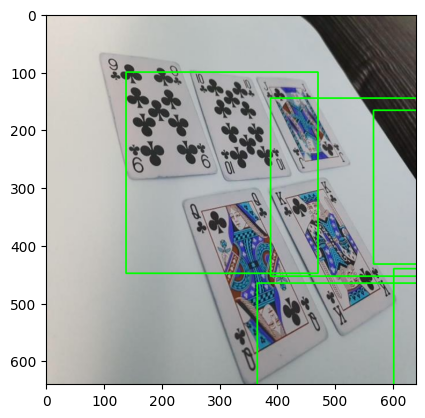

In [ ]:
fn = os.path.join(image_directory_path, fn)
image = cv2.imread(fn)
for bbox in bboxes:
  x1, y1, x2, y2 = bbox
  cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
plt.imshow(image)

In [ ]:
parse_annotations(suffix)

(['9 of clubs',
  '10 of clubs',
  'jack  of clubs',
  'queen of clubs',
  'king of clubs'],
 [[138], [388], [566], [365], [601]])

In [ ]:
import re
def parse_annotations(annotation_string):
    # Regular expression to match the labels and their corresponding locations
    pattern = r'([a-zA-Z0-9\s]+)<loc_(\d+)>'

    # Find all matches in the string
    matches = re.findall(pattern, annotation_string)

    labels = []
    bboxes = []

    current_label = None
    current_bbox = []

    for match in matches:
        label, coord = match
        coord = int(coord)

        if label.strip():
            if current_label and current_bbox:
                # Save the previous label and bbox
                labels.append(current_label.strip())
                bboxes.append(current_bbox)
                current_bbox = []

            current_label = label

        current_bbox.append(coord)

    # Add the last label and bbox
    if current_label and current_bbox:
        labels.append(current_label.strip())
        bboxes.append(current_bbox)

    return labels, bboxes

## LSCD
bbox column seems to contains bboxes in the format :
(x1,y1, width, height)  

Florence-2 processor expects bboxes in the format:  
(xmin, ymin, xmax,ymax)  

We need to provide bbxes in the format expected by the processor

In [ ]:
zip_file_path = './images/LSCD.zip'
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Extract the list of filenames
    lscd_filenames = zip_ref.namelist()

lscd_fn_df = pd.DataFrame(lscd_filenames,
                          columns = ['file_name'])
lscd_fn_df.shape

(7741, 1)

In [ ]:
file_name = 'annotations/instances_train2017.json'
zip_file_path = './images/LSCD.zip'
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    with zip_ref.open(file_name) as file:
        file_content = file.read()
        file_text = file_content.decode('utf-8')

json_data = json.loads(file_text)


lscd_image_train_df = pd.DataFrame(json_data['images'])
lscd_annot_train_df = pd.DataFrame(json_data['annotations'])

lscd_image_train_df.shape, lscd_annot_train_df.shape

((6735, 4), (70838, 7))

In [ ]:
lscd_image_train_df.rename(columns={'id' : 'image_id'}, inplace=True)
lscd_image_train_df = lscd_image_train_df.merge(lscd_annot_train_df[['image_id',
                                                        'segmentation',
                                                                     'bbox']],
                    on='image_id')
lscd_image_train_df.shape

(70838, 6)

In [ ]:
lscd_image_train_df

,height,width,image_id,file_name,segmentation,bbox
0,3680,2728,0,2850.jpg,"[[90.82352941176464, 3184.3529411764703, 1467....","[90.82352941176464, 3125.529411764706, 1376.47..."
1,3680,2728,0,2850.jpg,"[[1467.2941176470586, 3125.529411764706, 2331....","[1467.2941176470586, 3096.1176470588234, 864.7..."
2,3680,2728,0,2850.jpg,"[[2331.9999999999995, 3096.1176470588234, 2727...","[2302.5882352941176, 3070.0, 424.4117647058824..."
3,3680,2728,0,2850.jpg,"[[967.2941176470586, 2684.3529411764703, 2320....","[961.411764705882, 2654.941176470588, 1370.588..."
4,3680,2728,0,2850.jpg,"[[20.235294117646845, 2696.1176470588234, 967....","[20.235294117646845, 2678.470588235294, 947.05..."
...,...,...,...,...,...,...
70833,3264,2448,6734,4 (79).jpg,"[[1846.9655172413795, 1842.7586206896553, 2447...","[1805.586206896552, 1842.0, 641.4137931034479,..."
70834,3264,2448,6734,4 (79).jpg,"[[1891.7931034482763, 935.8620689655173, 2447....","[1891.7931034482763, 1.0, 555.2068965517237, 9..."
70835,3264,2448,6734,4 (79).jpg,"[[1871.1034482758623, 939.3103448275863, 1933....","[1129.7241379310349, 0.0, 803.2758620689651, 9..."
70836,3264,2448,6734,4 (79).jpg,"[[1174.5517241379312, 963.4482758620691, 474.5...","[313.0, 0.0, 861.5517241379312, 980.6896551724..."


### visualize image

In [ ]:

image_ids = list(lscd_image_train_df['image_id'].unique())
print(len(image_ids))

6733


this is an original image without segments:

In [ ]:
image_df

,height,width,image_id,file_name,segmentation,bbox
139,1582,2386,10,1683.jpg,"[[141.62295081967213, 273.04918032786884, 728....","[141.62295081967213, 77.9672131147541, 1313.11..."
140,1582,2386,10,1683.jpg,"[[1295.72131147541, 271.40983606557376, 1462.9...","[1295.72131147541, 73.04918032786885, 1075.409..."


In [ ]:
image_df['segmentation'].tolist()[1]

[[1295.72131147541,
  271.40983606557376,
  1462.9344262295083,
  74.68852459016394,
  2187.5245901639346,
  73.04918032786885,
  2371.131147540984,
  269.7704918032787,
  2341.622950819672,
  1500.9180327868853,
  1310.4754098360656,
  1502.5573770491803]]

images/train2017/1683.jpg


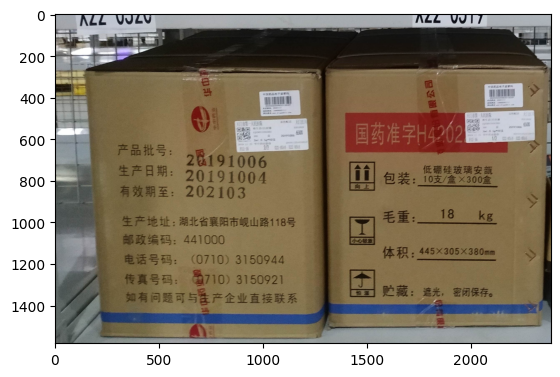

In [ ]:
n = 10
image_id = image_ids[n]
image_df = lscd_image_train_df.query("image_id==@image_id")

image_suffix = image_df.iloc[1,3]
img_fn = f"images/train2017/{image_suffix}"
print(img_fn)

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
  with zip_ref.open(img_fn) as file:
    file_content = file.read()
    image = Image.open(BytesIO(file_content))
plt.imshow(image);

let's draw segments on the image using 'segmentation' column

In [ ]:
def convert_to_numpy_array(coordinates_list):
    # Convert the list to a NumPy array
    coordinates_array = np.array(coordinates_list)

    # Reshape the array to separate x and y coordinates
    reshaped_array = coordinates_array.reshape(-1, 2)

    # Convert the coordinates to integers
    integer_array = reshaped_array.astype(np.int32)

    # Further reshape to the desired output format
    final_array = integer_array.reshape(len(coordinates_list), -1, 2)

    return final_array
def convert_to_polygon_array(coordinates_list):
    # Convert the list to a NumPy array
    coordinates_array = np.array(coordinates_list)

    # Reshape the array to separate x and y coordinates and ensure each coordinate pair is represented properly
    reshaped_array = coordinates_array.reshape(len(coordinates_list), -1, 2)

    # Convert the coordinates to integers
    integer_array = reshaped_array.astype(np.int32)

    return integer_array

def convert_to_polygon_array(coordinates_list):
    polygons = []
    for coordinates in coordinates_list:
        # Convert the list to a NumPy array and reshape it to separate x and y coordinates
        coordinates_array = np.array(coordinates).reshape(-1, 2)

        # Convert the coordinates to integers
        integer_array = coordinates_array.astype(np.int32)

        polygons.append(integer_array)

    return polygons

def draw_polygons(image_path, polygons, output_path=None):
    # Load the image
    image = cv2.imread(image_path)

    # Loop through the list of polygons and draw each one on the image
    for polygon in polygons:
        # Draw the polygon by connecting each point
        cv2.polylines(image, [polygon], isClosed=True, color=(0, 255, 0), thickness=2)

    # Display the image with polygons (optional)
    cv2.imshow('Image with Polygons', image)
    cv2.waitKey(0)  # Wait for a key press to close the window
    cv2.destroyAllWindows()

    # Save the image with polygons if an output path is provided (optional)
    if output_path:
        cv2.imwrite(output_path, image)

In [ ]:
segments = image_df['segmentation'].tolist()
print(len(segments))
polygons = convert_to_polygon_array(segments)
print(len(polygons))

2
2


In [ ]:
polygons

[array([[ 141,  273],
        [ 728,   77],
        [1454,   79],
        [1292,  269],
        [1308, 1441],
        [1269, 1556],
        [ 226, 1546]], dtype=int32),
 array([[1295,  271],
        [1462,   74],
        [2187,   73],
        [2371,  269],
        [2341, 1500],
        [1310, 1502]], dtype=int32)]

In [ ]:
polygons

[array([[ 141,  273],
        [ 728,   77],
        [1454,   79],
        [1292,  269],
        [1308, 1441],
        [1269, 1556],
        [ 226, 1546]], dtype=int32),
 array([[1295,  271],
        [1462,   74],
        [2187,   73],
        [2371,  269],
        [2341, 1500],
        [1310, 1502]], dtype=int32)]

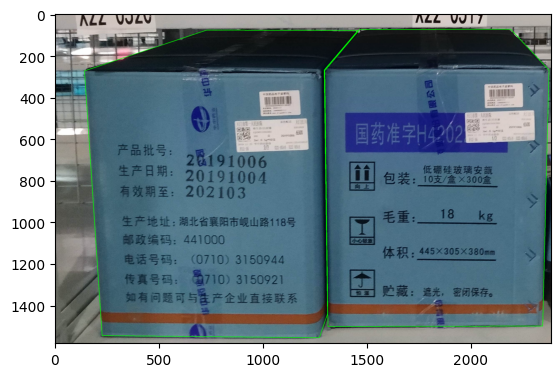

In [ ]:
numpy_image = np.array(image)
numpy_image = cv2.cvtColor(numpy_image, cv2.COLOR_RGB2BGR)
for polygon in polygons:
        # Draw the polygon by connecting each point
        cv2.polylines(numpy_image, [polygon],
                      isClosed=True,
                      color=(0, 255, 0),
                      thickness=2)
plt.imshow(numpy_image);

In [ ]:
def convert_polygons_to_bboxes(polygons):
    bboxes = []
    for polygon in polygons:
        # Reshape the polygon to separate x and y coordinates
        coordinates_array = np.array(polygon).reshape(-1, 2)

        # Extract x and y coordinates
        x_coords = coordinates_array[:, 0]
        y_coords = coordinates_array[:, 1]

        # Calculate the bounding box coordinates
        x_min = int(np.min(x_coords))
        y_min = int(np.min(y_coords))
        x_max = int(np.max(x_coords))
        y_max = int(np.max(y_coords))

        # Form the bounding box as [x_min, y_min, x_max, y_max]
        bbox = [x_min, y_min, x_max, y_max]
        bboxes.append(bbox)

    return bboxes

In [ ]:
bboxes = convert_polygons_to_bboxes(polygons)
len(bboxes)

2

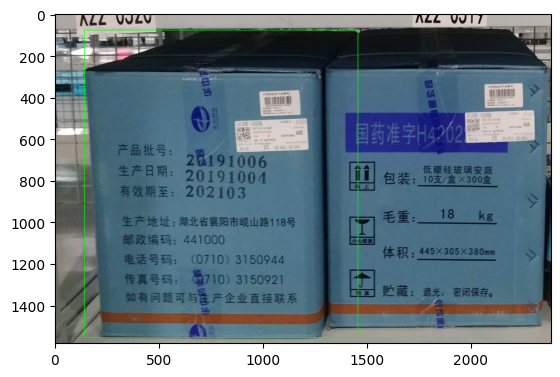

In [ ]:
numpy_image = np.array(image)
numpy_image = cv2.cvtColor(numpy_image, cv2.COLOR_RGB2BGR)
for bbox in bboxes:
        x1, y1, x2, y2 = bbox
        cv2.rectangle(numpy_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        break
plt.imshow(numpy_image)

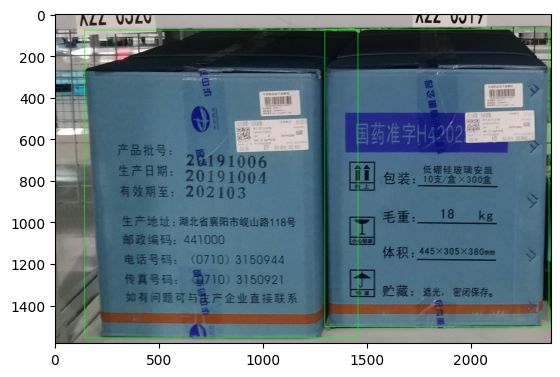

In [ ]:
numpy_image = np.array(image)
numpy_image = cv2.cvtColor(numpy_image, cv2.COLOR_RGB2BGR)
bboxes = image_df['bbox'].apply(lambda x: [int(x[0]),
                                           int(x[1]),
                                           int(x[0]+x[2]),
                                           int(x[1]+x[3])]).tolist()
for bbox in bboxes:
        x1, y1, x2, y2 = bbox
        cv2.rectangle(numpy_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
plt.imshow(numpy_image)

### create train ds - bboxes
bboxes are less accurate than polygons, but they need only 4 coordinates, whereas polygons can include 6 and more coordinates. Since many images may contains dozens of segments, sequence of polygon coordinates may become very long.  

Therefore we will first create a dataset based on bboxes.  

We will convert COCO format (x1,y1, W, H) into (x1,y1, x2, y2) format

we will take a sample of 1000 images from LSCD and 1000 images from OSCD datasets

In [ ]:
from random import choices
image_ids = lscd_image_train_df['image_id'].unique()

sample_image_ids = choices(image_ids, k=1000)
len(sample_image_ids)

1000

In [ ]:
sample_lscd_image_train_df = lscd_image_train_df.query("file_name.str.contains('.jpg')\
& image_id==@sample_image_ids")
sample_lscd_image_train_df.shape

(9696, 6)

In [ ]:
sample_lscd_image_train_df['file_path'] = \
sample_lscd_image_train_df['file_name'].apply(lambda x: f"images/train2017/{x}")
sample_lscd_image_train_df.shape

<ipython-input-18-9a9c5ca34278>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_lscd_image_train_df['file_path'] = \


(9696, 7)

In [ ]:
sample_lscd_image_train_df['bbox'] = \
            sample_lscd_image_train_df['bbox'].apply(lambda x:
                                          [int(x[0]),
                                           int(x[1]),
                                           int(x[0]+x[2]),
                                           int(x[1]+x[3])]
                                                     )

<ipython-input-20-2a032bfbf382>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_lscd_image_train_df['bbox'] = \


In [ ]:
sample_lscd_image_train_df['zip_file_path'] = './images/LSCD.zip'

<ipython-input-21-f139a592d7ce>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_lscd_image_train_df['zip_file_path'] = './images/LSCD.zip'


## OSCD

In [ ]:
zip_file_path = './images/OSCD.zip'
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Extract the list of filenames
    oscd_filenames = zip_ref.namelist()

oscd_fn_df = pd.DataFrame(oscd_filenames,
                          columns = ['file_name'])
oscd_fn_df.shape

(25212, 1)

In [ ]:
file_name = 'coco_carton/oneclass_carton/annotations/instances_train2017.json'
zip_file_path = './images/OSCD.zip'
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    with zip_ref.open(file_name) as file:
        file_content = file.read()
        file_text = file_content.decode('utf-8')

json_data = json.loads(file_text)


oscd_image_train_df = pd.DataFrame(json_data['images'])
oscd_annot_train_df = pd.DataFrame(json_data['annotations'])

oscd_image_train_df.shape, oscd_annot_train_df.shape

((7401, 4), (148568, 7))

In [ ]:
oscd_image_train_df.rename(columns={'id' : 'image_id'}, inplace=True)
oscd_image_train_df = oscd_image_train_df.merge(oscd_annot_train_df[['image_id',
                                                        'segmentation',
                                                                     'bbox']],
                    on='image_id')
oscd_image_train_df.shape

(148568, 6)

### create train_df - bboxes

In [ ]:
from random import choices
image_ids = oscd_image_train_df['image_id'].unique()

sample_image_ids = choices(image_ids, k=1000)
len(sample_image_ids)

1000

In [ ]:
sample_oscd_image_train_df = oscd_image_train_df.query("file_name.str.contains('.jpg')\
& image_id==@sample_image_ids")
sample_oscd_image_train_df.shape

(19229, 6)

In [ ]:
sample_oscd_image_train_df['file_path'] = \
sample_oscd_image_train_df['file_name'].apply(lambda x: f"coco_carton/oneclass_carton/images/train2017/{x}")
sample_oscd_image_train_df.shape

<ipython-input-27-37f73f0541ad>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_oscd_image_train_df['file_path'] = \


(19229, 7)

In [ ]:
sample_oscd_image_train_df['zip_file_path'] = './images/OSCD.zip'

<ipython-input-28-5213e2110175>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_oscd_image_train_df['zip_file_path'] = './images/OSCD.zip'


In [ ]:
sample_oscd_image_train_df['bbox'] = \
              sample_oscd_image_train_df['bbox'].apply(lambda x:
                                          [int(x[0]),
                                           int(x[1]),
                                           int(x[0]+x[2]),
                                           int(x[1]+x[3])]
                                                     )

<ipython-input-29-4f33893c59ff>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_oscd_image_train_df['bbox'] = \


## combine images into a single ds

## train_df - bboxes

In [ ]:
df = pd.concat([sample_lscd_image_train_df,
                sample_oscd_image_train_df])
df.shape

(28925, 8)

In [ ]:
df['output_image_fn'] = df.apply(lambda x:
                                 f"{x.zip_file_path.split('/')[-1].split('.')[0]}_{x.image_id}.jpg",
                                 axis=1)
df.shape

(28925, 9)

In [ ]:
image_ids = df.image_id.unique().tolist()
print(len(image_ids))

1749


In [ ]:
train_image_ids = image_ids[:1550]
test_image_ids = image_ids[1550:1650]
val_image_ids = image_ids[1650:]
print(len(train_image_ids), len(test_image_ids), len(val_image_ids))

1550 100 99


In [ ]:
train_df = df.query("image_id==@train_image_ids")
test_df = df.query("image_id==@test_image_ids")
val_df = df.query("image_id==@val_image_ids")
print(train_df.shape, test_df.shape, val_df.shape)

(24482, 9) (2238, 9) (2205, 9)


we will use the following function to create annotations according to what Florence-2 expects

In [ ]:
def get_image_annotation(gr):
  image_data = {}
  suffix = []
  for row in gr.itertuples():
    coords = [int(s) for s in row.bbox]
    box_suffix = f"box<loc_{coords[0]}><loc_{coords[1]}><loc_{coords[2]}><loc_{coords[3]}>"
    suffix.append(box_suffix)
  suffix = ''.join(suffix)
  image_data['image'] = row.output_image_fn
  image_data['prefix'] = '<OD>'
  image_data['suffix'] = suffix
  return image_data

#### save train_df images:

In [72]:
image_directory_path = 'ft-bbox-dataset/train'

annotations = []
grouped = train_df.groupby('output_image_fn')
print(len(grouped))
count = 0
for output_image_fn, gr in grouped:
  print(output_image_fn, gr.shape)
  image_annotation = get_image_annotation(gr)
  annotations.append(image_annotation)

  # extract image and save it to image folder
  zip_file_path = gr.iloc[0,-2]
  image_file_path = gr.iloc[0,-3]
  with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    with zip_ref.open(image_file_path) as file:
        file_content = file.read()
        image = Image.open(BytesIO(file_content))
        image.save(f"{image_directory_path}/{output_image_fn}")
  count+=1
  print(count, len(annotations))

len(annotations)

1655
LSCD_1005.jpg (19, 9)
1 1
LSCD_1009.jpg (12, 9)
2 2
LSCD_1013.jpg (3, 9)
3 3
LSCD_1016.jpg (3, 9)
4 4
LSCD_1019.jpg (4, 9)
5 5
LSCD_102.jpg (12, 9)
6 6
LSCD_1022.jpg (8, 9)
7 7
LSCD_1028.jpg (4, 9)
8 8
LSCD_1048.jpg (4, 9)
9 9
LSCD_1051.jpg (32, 9)
10 10
LSCD_1063.jpg (9, 9)
11 11
LSCD_1071.jpg (19, 9)
12 12
LSCD_1086.jpg (7, 9)
13 13
LSCD_1130.jpg (2, 9)
14 14
LSCD_1142.jpg (13, 9)
15 15
LSCD_1147.jpg (8, 9)
16 16
LSCD_1149.jpg (4, 9)
17 17
LSCD_1154.jpg (2, 9)
18 18
LSCD_1156.jpg (6, 9)
19 19
LSCD_1163.jpg (8, 9)
20 20
LSCD_118.jpg (7, 9)
21 21
LSCD_1180.jpg (15, 9)
22 22
LSCD_1182.jpg (3, 9)
23 23
LSCD_1184.jpg (8, 9)
24 24
LSCD_1197.jpg (9, 9)
25 25
LSCD_1216.jpg (10, 9)
26 26
LSCD_1217.jpg (6, 9)
27 27
LSCD_1224.jpg (5, 9)
28 28
LSCD_1227.jpg (34, 9)
29 29
LSCD_1232.jpg (8, 9)
30 30
LSCD_1239.jpg (8, 9)
31 31
LSCD_1242.jpg (6, 9)
32 32
LSCD_125.jpg (12, 9)
33 33
LSCD_1253.jpg (3, 9)
34 34
LSCD_1258.jpg (16, 9)
35 35
LSCD_1262.jpg (6, 9)
36 36
LSCD_1273.jpg (8, 9)
37 37
LSCD_1

1655

In [73]:
annotations[1000]

{'image': 'OSCD_1524.jpg',
 'prefix': '<OD>',
 'suffix': 'box<loc_0><loc_30><loc_19><loc_52>box<loc_0><loc_50><loc_21><loc_66>box<loc_0><loc_66><loc_25><loc_88>box<loc_0><loc_88><loc_29><loc_106>box<loc_0><loc_106><loc_33><loc_137>box<loc_29><loc_96><loc_109><loc_145>box<loc_19><loc_48><loc_106><loc_102>box<loc_14><loc_0><loc_104><loc_49>box<loc_103><loc_0><loc_191><loc_49>box<loc_104><loc_49><loc_184><loc_97>box<loc_108><loc_97><loc_195><loc_129>box<loc_178><loc_14><loc_200><loc_126>'}

let's save annotations in json line format

In [ ]:
! pip install jsonlines
from IPython.display import clear_output
clear_output()
import jsonlines

In [74]:
file_name = 'annotations.jsonl'
file_name = os.path.join(image_directory_path, file_name)
with jsonlines.open(file_name, mode='w') as writer:
    # for annotation in annotations:
    writer.write_all(annotations)

In [75]:
files = os.listdir(image_directory_path)
len(files)

1656

#### save val_df images

In [76]:
image_directory_path = 'ft-bbox-dataset/val'

annotations = []
grouped = val_df.groupby('output_image_fn')
print(len(grouped))
count = 0
for output_image_fn, gr in grouped:
  print(output_image_fn, gr.shape)
  image_annotation = get_image_annotation(gr)
  annotations.append(image_annotation)

  # extract image and save it to image folder
  zip_file_path = gr.iloc[0,-2]
  image_file_path = gr.iloc[0,-3]
  with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    with zip_ref.open(image_file_path) as file:
        file_content = file.read()
        image = Image.open(BytesIO(file_content))
        image.save(f"{image_directory_path}/{output_image_fn}")
  count+=1
  print(count, len(annotations))

len(annotations)

99
OSCD_6551.jpg (15, 9)
1 1
OSCD_6553.jpg (18, 9)
2 2
OSCD_6565.jpg (25, 9)
3 3
OSCD_6566.jpg (12, 9)
4 4
OSCD_6573.jpg (10, 9)
5 5
OSCD_6586.jpg (14, 9)
6 6
OSCD_6606.jpg (24, 9)
7 7
OSCD_6608.jpg (8, 9)
8 8
OSCD_6624.jpg (21, 9)
9 9
OSCD_6627.jpg (25, 9)
10 10
OSCD_6629.jpg (12, 9)
11 11
OSCD_6632.jpg (38, 9)
12 12
OSCD_6650.jpg (16, 9)
13 13
OSCD_6653.jpg (4, 9)
14 14
OSCD_6659.jpg (9, 9)
15 15
OSCD_6663.jpg (6, 9)
16 16
OSCD_6670.jpg (44, 9)
17 17
OSCD_6674.jpg (13, 9)
18 18
OSCD_6687.jpg (17, 9)
19 19
OSCD_6688.jpg (17, 9)
20 20
OSCD_6695.jpg (26, 9)
21 21
OSCD_6720.jpg (18, 9)
22 22
OSCD_6728.jpg (54, 9)
23 23
OSCD_6730.jpg (11, 9)
24 24
OSCD_6735.jpg (22, 9)
25 25
OSCD_6746.jpg (6, 9)
26 26
OSCD_6747.jpg (24, 9)
27 27
OSCD_6754.jpg (15, 9)
28 28
OSCD_6758.jpg (15, 9)
29 29
OSCD_6772.jpg (14, 9)
30 30
OSCD_6789.jpg (8, 9)
31 31
OSCD_6801.jpg (7, 9)
32 32
OSCD_6806.jpg (30, 9)
33 33
OSCD_6820.jpg (17, 9)
34 34
OSCD_6822.jpg (57, 9)
35 35
OSCD_6840.jpg (39, 9)
36 36
OSCD_6841.jpg 

99

In [77]:
file_name = 'annotations.jsonl'
file_name = os.path.join(image_directory_path, file_name)
with jsonlines.open(file_name, mode='w') as writer:
    # for annotation in annotations:
    writer.write_all(annotations)

In [78]:
files = os.listdir(image_directory_path)
len(files)

100

#### save test_df images

In [79]:
image_directory_path = 'ft-bbox-dataset/test'

annotations = []
grouped = test_df.groupby('output_image_fn')
print(len(grouped))
count = 0
for output_image_fn, gr in grouped:
  print(output_image_fn, gr.shape)
  image_annotation = get_image_annotation(gr)
  annotations.append(image_annotation)

  # extract image and save it to image folder
  zip_file_path = gr.iloc[0,-2]
  image_file_path = gr.iloc[0,-3]
  with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    with zip_ref.open(image_file_path) as file:
        file_content = file.read()
        image = Image.open(BytesIO(file_content))
        image.save(f"{image_directory_path}/{output_image_fn}")
  count+=1
  print(count, len(annotations))

len(annotations)

100
OSCD_5513.jpg (27, 9)
1 1
OSCD_5514.jpg (11, 9)
2 2
OSCD_5516.jpg (43, 9)
3 3
OSCD_5517.jpg (42, 9)
4 4
OSCD_5533.jpg (40, 9)
5 5
OSCD_5540.jpg (16, 9)
6 6
OSCD_5541.jpg (25, 9)
7 7
OSCD_5563.jpg (13, 9)
8 8
OSCD_5564.jpg (10, 9)
9 9
OSCD_5565.jpg (11, 9)
10 10
OSCD_5588.jpg (12, 9)
11 11
OSCD_5604.jpg (16, 9)
12 12
OSCD_5608.jpg (4, 9)
13 13
OSCD_5619.jpg (15, 9)
14 14
OSCD_5622.jpg (43, 9)
15 15
OSCD_5625.jpg (32, 9)
16 16
OSCD_5640.jpg (21, 9)
17 17
OSCD_5644.jpg (26, 9)
18 18
OSCD_5647.jpg (10, 9)
19 19
OSCD_5667.jpg (15, 9)
20 20
OSCD_5670.jpg (50, 9)
21 21
OSCD_5672.jpg (15, 9)
22 22
OSCD_5692.jpg (48, 9)
23 23
OSCD_5698.jpg (25, 9)
24 24
OSCD_5709.jpg (11, 9)
25 25
OSCD_5713.jpg (26, 9)
26 26
OSCD_5716.jpg (30, 9)
27 27
OSCD_5729.jpg (11, 9)
28 28
OSCD_5732.jpg (6, 9)
29 29
OSCD_5733.jpg (29, 9)
30 30
OSCD_5740.jpg (40, 9)
31 31
OSCD_5744.jpg (9, 9)
32 32
OSCD_5768.jpg (10, 9)
33 33
OSCD_5775.jpg (55, 9)
34 34
OSCD_5778.jpg (19, 9)
35 35
OSCD_5782.jpg (11, 9)
36 36
OSCD_5784

100

In [80]:
file_name = 'annotations.jsonl'
file_name = os.path.join(image_directory_path, file_name)
with jsonlines.open(file_name, mode='w') as writer:
    # for annotation in annotations:
    writer.write_all(annotations)

In [81]:
files = os.listdir(image_directory_path)
len(files)

101

# LSCD_occlusions
this is the third dataset in SCD collection. We are not using it at the moment

In [ ]:
zip_file_path = './images/LSCD_occlusions.zip'
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Extract the list of filenames
    lscd_occlusions_filenames = zip_ref.namelist()
lscd_occl_fn_df = pd.DataFrame(lscd_filenames,
                          columns = ['file_name'])

lscd_occl_fn_df.shape

(7741, 1)

In [ ]:
lscd_occl_fn_df.sample(20)

,file_name
5952,images/train2017/l (126).jpg
7289,images/val2017/4 (16).jpg
6577,images/train2017/y (130).jpg
5198,images/train2017/IMG_20191125_124222.jpg
6804,images/val2017/1009.jpg
5893,images/train2017/IMG_20200917_142751.jpg
7692,images/val2017/w (232).jpg
1269,images/train2017/2 (176).jpg
4657,images/train2017/602.jpg
2823,images/train2017/3 (359).jpg


In [ ]:
file_name = 'annotations/instances_train2017.json'

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    with zip_ref.open(file_name) as file:
        file_content = file.read()
        file_text = file_content.decode('utf-8')

json_data = json.loads(file_text)

lscd_occl_image_train_df = pd.DataFrame(json_data['images'])
lscd_occl_annot_train_df = pd.DataFrame(json_data['annotations'])

lscd_occl_image_train_df.shape, lscd_occl_annot_train_df.shape

((6735, 4), (71480, 7))

In [ ]:
lscd_occl_image_train_df.rename(columns={'id' : 'image_id'}, inplace=True)
lscd_occl_image_train_df = lscd_occl_image_train_df.merge(lscd_occl_annot_train_df[['image_id',
                                                        'segmentation']],
                    on='image_id')
lscd_occl_image_train_df.shape

(71480, 5)

In [ ]:
from random import choices
image_ids = lscd_occl_image_train_df['image_id'].unique()

sample_image_ids = choices(image_ids, k=1000)
len(sample_image_ids)

1000

In [ ]:
sample_lscd_occl_image_train_df = lscd_occl_image_train_df.query("file_name.str.contains('.jpg')\
& image_id==@sample_image_ids")
sample_lscd_occl_image_train_df.shape

(9817, 5)

In [ ]:
sample_lscd_occl_image_train_df['file_path'] = \
sample_lscd_occl_image_train_df['file_name'].apply(lambda x: f"images/train2017/{x}")
sample_lscd_occl_image_train_df.shape


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


(9817, 6)

In [ ]:
sample_lscd_occl_image_train_df['zip_file_path']='./images/LSCD_occlusions.zip'


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
  for row in sample_lscd_occl_image_train_df.itertuples():

    with zip_ref.open(row.file_path) as file:
          file_content = file.read()
          image = Image.open(BytesIO(file_content))
          break

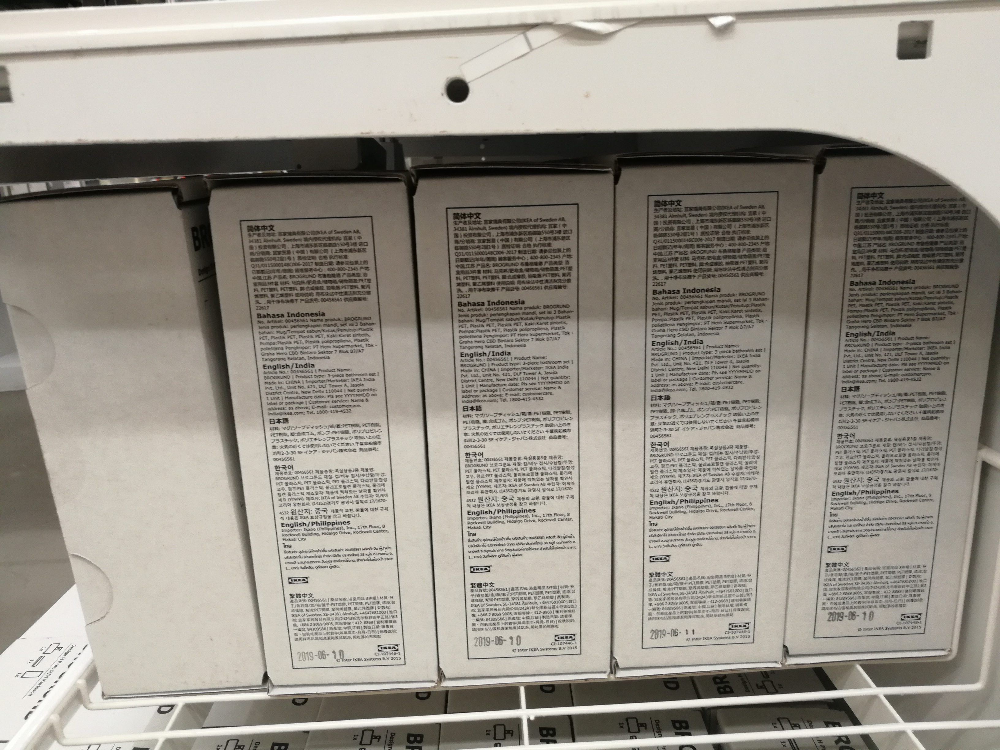

In [ ]:
image